In [1]:
import json
import folium
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Loading the Data
We'll start by loading the data from csv files

We combined the "Election Results by Polling Stations", "Polling Station Addresses" and "Geolocation Data" we gathered and described in 'Data' and combined it to create the Kalpi_locations.csv dataset. 
Going Forward this will be our dataset whenever we want to analyze the polling stations.

In [2]:
df = pd.read_csv('kalpi_locations.csv')
df

,סמל ועדה_x,ברזל,שם ישוב,סמל ישוב,קלפי,ריכוז,שופט,בזב,מצביעים,פסולים,...,בוחרי כנסת בפועל,Latitude,Longitude,preference,coalition_votes,opposition_votes,didnt_pass_votes,Preference,Category,Region
0,18,10619,אבו גווייעד שבט,967,3.1,1,0,570,173,4,...,570.0,31.160927,35.019757,Opposition,9,154,6,עם,Opposition,Ar'ara Banegev
1,18,10620,אבו גווייעד שבט,967,3.2,1,0,570,96,1,...,570.0,31.160927,35.019757,Opposition,1,93,1,עם,Opposition,Ar'ara Banegev
2,18,10621,אבו גווייעד שבט,967,3.3,1,0,570,169,1,...,570.0,31.160927,35.019757,Opposition,2,166,0,עם,Opposition,Ar'ara Banegev
3,18,10622,אבו גווייעד שבט,967,3.4,1,0,569,111,3,...,569.0,31.160927,35.019757,Opposition,4,100,4,עם,Opposition,Ar'ara Banegev
4,2,806,אבו גוש,472,1.1,5,0,598,360,7,...,598.0,31.787919,35.089689,Didn't Pass,12,159,182,ד,Didn't Pass,Ma'te Yehuda
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12447,2,1141,תקוע,3563,3.0,3,0,500,367,3,...,500.0,31.653280,35.229326,Coalition,251,34,79,ט,Coalition,NaN
12448,2,1142,תקוע,3563,4.0,3,0,582,426,3,...,582.0,31.653280,35.229326,Coalition,291,57,75,ט,Coalition,NaN
12449,18,10541,תראבין אצאנע שבט,970,1.0,1,0,582,74,2,...,582.0,31.345481,34.739126,Opposition,28,43,1,עם,Opposition,El Kasum
12450,18,10495,תראבין אצאנעישוב,1346,1.0,1,0,650,248,5,...,650.0,31.345481,34.739126,Coalition,144,90,9,מחל,Coalition,El Kasum


For the clustering features we'll take all the party columns and normalize the by dividing with the total valid votes, thus keeping only the percentage of votes for each party in a polling station and omitting the variability of the polling station's size.
We'll clean the data, removing each missing entry.

In [3]:
normalized_data = df.iloc[:, 11:51].div(df.iloc[:, 10], axis=0)
cleaned_data = pd.concat([df[['ברזל']], normalized_data], axis=1).dropna()
cleaned_data

,ברזל,אמת,אצ,ב,ג,ד,ום,ז,זך,זנ,...,צ,ץ,ק,קי,קך,קנ,קץ,רז,שס,ת
0,10619,0.000000,0.000000,0.000000,0.000000,0.023669,0.124260,0.0,0.0,0.000000,...,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.011834
1,10620,0.010526,0.000000,0.000000,0.000000,0.000000,0.021053,0.0,0.0,0.000000,...,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.010526
2,10621,0.000000,0.000000,0.000000,0.000000,0.000000,0.071429,0.0,0.0,0.000000,...,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.011905,0.000000
3,10622,0.000000,0.000000,0.000000,0.000000,0.000000,0.027778,0.0,0.0,0.009259,...,0.009259,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.018519,0.000000
4,806,0.002833,0.000000,0.000000,0.000000,0.484419,0.121813,0.0,0.0,0.000000,...,0.000000,0.002833,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12447,1141,0.010989,0.008242,0.181319,0.002747,0.000000,0.002747,0.0,0.0,0.000000,...,0.002747,0.000000,0.0,0.000000,0.0,0.0,0.016484,0.0,0.032967,0.000000
12448,1142,0.014184,0.007092,0.156028,0.007092,0.000000,0.000000,0.0,0.0,0.000000,...,0.000000,0.000000,0.0,0.002364,0.0,0.0,0.002364,0.0,0.007092,0.000000
12449,10541,0.000000,0.000000,0.000000,0.000000,0.000000,0.013889,0.0,0.0,0.000000,...,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000
12450,10495,0.004115,0.000000,0.000000,0.000000,0.024691,0.004115,0.0,0.0,0.000000,...,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.004115,0.0,0.004115,0.000000


# Clustering
We'll preform a clustering algorithm on the normalized data in order to find a hidden connection between the voting patterns. 

We'll use K-means clustering algorithm to find the clusters each polling station belongs to. 
In order to decide the best number of clusters (K), we'll use the elbow method.

In [4]:
def plot_elbow(k_range, inertia):
    plt.figure(figsize=(8, 6))
    plt.plot(k_range, inertia, marker='o')
    plt.title('Elbow Method for Optimal k')
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('Inertia')
    plt.grid(True)
    plt.show()

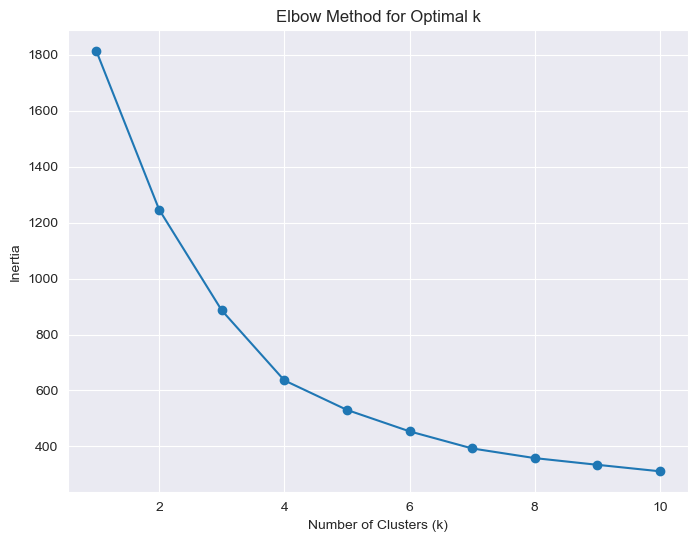

In [5]:
k_range = range(1, 11)
inertia = [KMeans(n_clusters=k, random_state=42, n_init=10).fit(normalized_data).inertia_ for k in k_range]
plot_elbow(k_range, inertia)

Deciding that the optimal number of clusters is 4, we'll perform K-means on our data and receive a cluster for each polling station.
Afterwards, we'll add the clusters classifications to the original data frame.

In [6]:
kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
cleaned_data['Cluster'] = kmeans.fit_predict(normalized_data)
df_with_clusters = df.merge(cleaned_data[['ברזל', 'Cluster']], on='ברזל',  how='left')

# Reviewing Results
We'll review the results the cluster we got in order to produce additional information

In order to see the correlation between different clusters and political parties, we'll plot the cluster distribution between several, specific, political parties. 

In [7]:
def plot_clusters(x, y, x_label, y_label, title, colors, clusters):
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(x, y, c=colors, alpha=0.7)
    plt.title(title)
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    legend_handles = [plt.Line2D([0], [0], marker='o', color='w',
                                 markerfacecolor=color_map[i], markersize=10)
                      for i in clusters]
    plt.legend(legend_handles, [f'Cluster {i}' for i in clusters],
               title="Clusters")
    plt.grid(True)
    plt.show()

In [8]:
color_map = {0: 'blue', 1: 'cyan', 2: 'red', 3: 'green'}
colors = cleaned_data['Cluster'].map(color_map)
clusters = np.unique(cleaned_data['Cluster'])

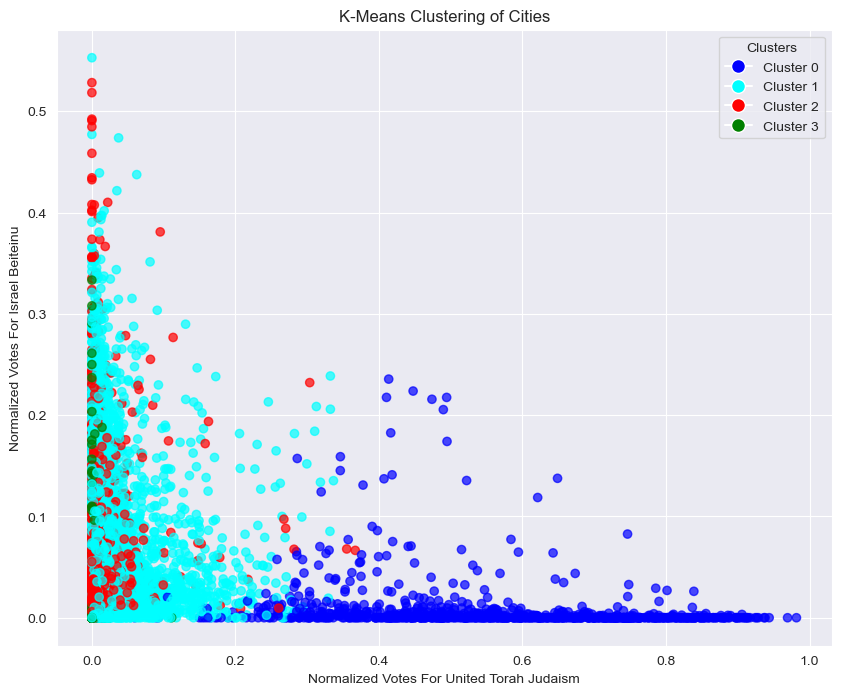

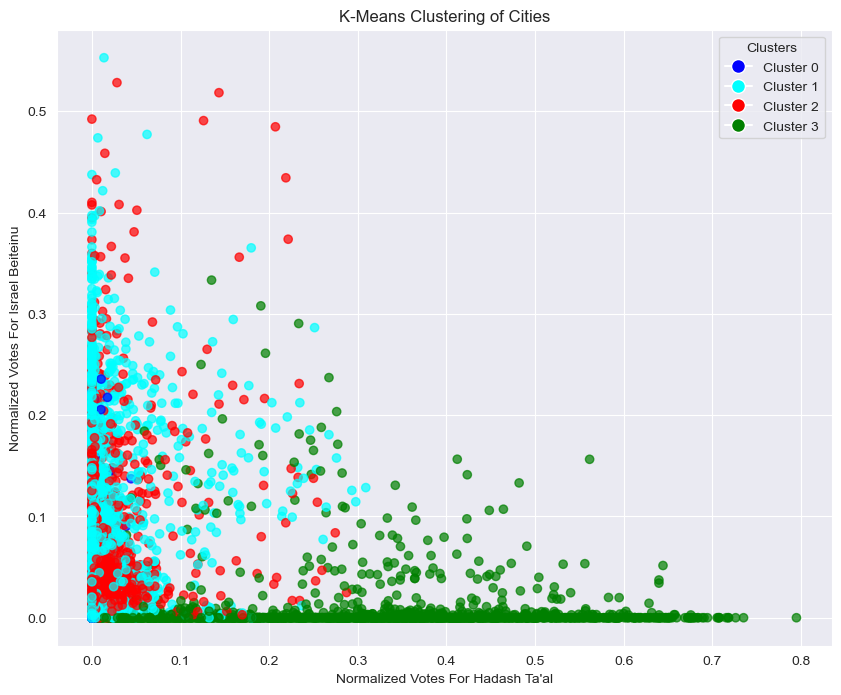

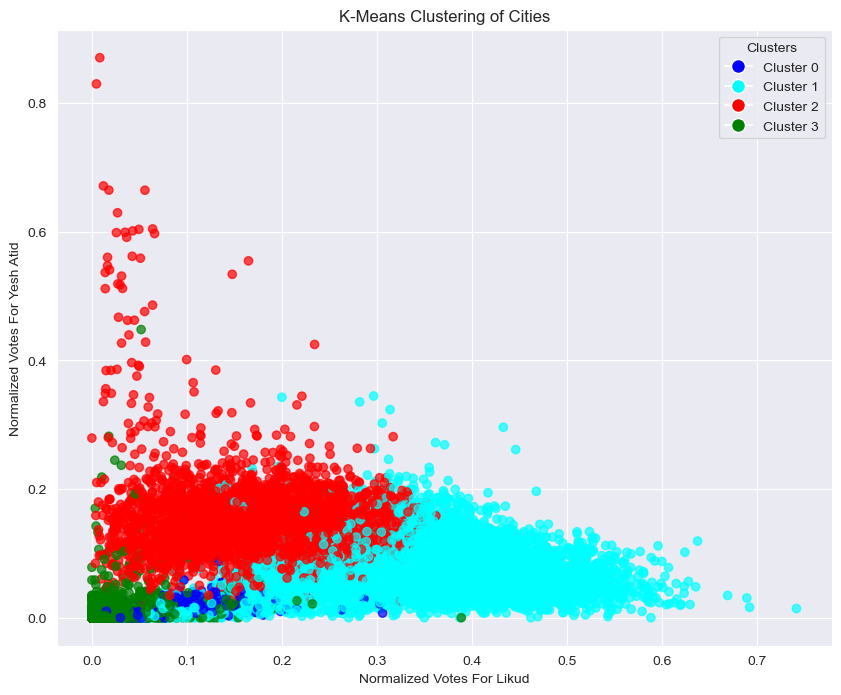

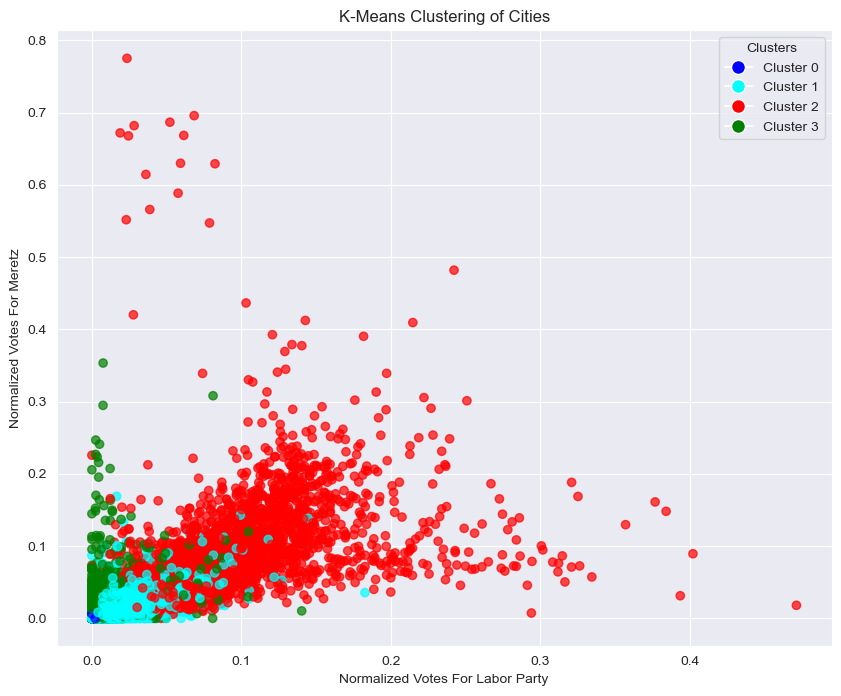

In [9]:
# Plot multiple scatter plots
plots = [
    ('ג', 'ל', 'Normalized Votes For United Torah Judaism',
     'Normalized Votes For Israel Beiteinu', 'K-Means Clustering of Cities'),
    ('ום', 'ל', 'Normalized Votes For Hadash Ta\'al',
     'Normalized Votes For Israel Beiteinu', 'K-Means Clustering of Cities'),
    ('מחל', 'כן', 'Normalized Votes For Likud', 'Normalized Votes For Yesh Atid',
     'K-Means Clustering of Cities'),
    ('אמת', 'מרצ', 'Normalized Votes For Labor Party',
     'Normalized Votes For Meretz', 'K-Means Clustering of Cities')
]

for x_col, y_col, x_label, y_label, title in plots:
    plot_clusters(normalized_data[x_col], normalized_data[y_col], x_label,
                  y_label, title, colors, clusters)

To further explore the correlation between clusters, we'll merge the different polling stations by Region, keeping the most prominent cluster in each area to represent that area's preferred cluster. Then, we'll use a choropleth, mapping the regions to a map of the country, in order to better observe the distribution of clusters among different municipalities. 

In [10]:
# Filter out noise points (label = -1)
df_with_clusters = df_with_clusters[df_with_clusters['Region'] != -1]

# Group by region and keep the most common cluster
regions_df = df_with_clusters.groupby('Region').agg(
    {'Cluster': lambda x: x.mode()[0]}  # Get the most common cluster
).reset_index()

# Rename the cluster column for clarity
regions_df.rename(columns={'Cluster': 'DominantCluster'}, inplace=True)

# Use the existing numeric values for clusters
regions_df['ClusterValue'] = regions_df['DominantCluster']

# Load the GeoJSON file for the geographic regions
with open('municipalities.json', 'r', encoding='utf-8') as f:
    regions_geojson = json.load(f)

# Create a mapping for the colors
colors = {
    0: 'blue',    # Color for Cluster 0
    1: 'cyan',     # Color for Cluster 1
    2: 'red',   # Color for Cluster 2
    3: 'green'   # New color for Cluster 3
}

# Create the base map
m = folium.Map(location=[31.0461, 34.8516], zoom_start=8)  # Centered on Israel


# Add a style function to apply custom colors based on the dominant cluster
def style_function(feature):
    region_name = feature['properties']['MUN_ENG']
    try:
        # Assuming Region is a string and matches MUN_ENG exactly
        cluster_value = regions_df.loc[regions_df['Region'].astype(str) == region_name, 'ClusterValue'].values[0]
        return {
            'fillColor': colors.get(cluster_value, 'white'),  # Default to white if cluster not found
            'color': 'black',
            'weight': 1,
            'fillOpacity': 0.6
        }
    except IndexError:
        return {
            'fillColor': 'white',
            'color': 'black',
            'weight': 1,
            'fillOpacity': 0.6
        }


# Create popups for the regions (optional)
def create_popup_text(region_name):
    return f"Region: {region_name}"


# Add the GeoJSON layer with popups
geojson_layer = folium.GeoJson(
    data=regions_geojson,
    style_function=style_function,
    name='Polling Station Preferences'
)

# Add popups to the GeoJson layer (if needed)
for feature in geojson_layer.data['features']:
    region_name = feature['properties']['MUN_ENG']
    feature['properties']['popup'] = create_popup_text(region_name)

popup = folium.GeoJsonPopup(
    fields=['popup'],
    aliases=['Region'],
    localize=True,
    labels=True,
    style="background-color: yellow;",
    sticky=True
)

geojson_layer.add_child(popup)

# Add the GeoJson layer to the map
geojson_layer.add_to(m)

# Add layer control to the map
folium.LayerControl().add_to(m)

# Create a custom HTML legend including the new cluster
legend_html = f'''
     <div style="
         position: fixed; 
         bottom: 50px; 
         left: 50px; 
         width: 120px; 
         height: 160px; 
         background-color: white; 
         border:2px solid grey; 
         z-index:9999;
         font-size:14px;
         padding: 10px;
         ">&nbsp; <b>Legend</b><br>
         &nbsp; Cluster 0: <i style="background:{colors[0]}; width: 20px; height: 23px; display: inline-block; border: 1px solid black;"></i><br>
         &nbsp; Cluster 1: <i style="background:{colors[1]}; width: 20px; height: 23px; display: inline-block; border: 1px solid black;"></i><br>
         &nbsp; Cluster 2: <i style="background:{colors[2]}; width: 20px; height: 23px; display: inline-block; border: 1px solid black;"></i><br>
         &nbsp; Cluster 3: <i style="background:{colors[3]}; width: 20px; height: 23px; display: inline-block; border: 1px solid black;"></i><br>
     </div>
     '''
m.get_root().html.add_child(folium.Element(legend_html))

# Save the map to an HTML file
m.save('polling_station_choropleth_clusters.html')

In [11]:
m